# Introduction

This notebook contains the experiments we conduct for our Ablation study. It has two parts, one short part to answer the question if the algorithm requires a reference in reconstruction to compute valuable recovery images and one part to investigate on the nececssity of oversampling in recovery and training.

In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

from dataset import *
from train_abs import *
from test_abs import *
from skimage.transform import resize
import skimage
import numpy

%load_ext autoreload
%autoreload 2

cuda
Loaded util functions


In [2]:
# import the sample images:
x_train_mnist, x_test_mnist = load_MNIST(32)
x_train_cifar, x_test_cifar = load_CIFAR10(32, channel =-1)
x_train_celeb, x_test_celeb = load_CELEBA(200, channel = -1)
std_images = load_STD()

Loaded MNIST dataset: x_train(100000, 32, 32), x_valid(140000, 32, 32)
Files already downloaded and verified
Files already downloaded and verified
using Gray image
Loaded CIFAR10 gray dataset: x_train(50000, 32, 32), x_valid(10000, 32, 32)
using Gray image
Loaded CELEBA gray dataset: x_train(200, 200, 200), x_valid(1000, 200, 200)
loaded standart images with shape: (6, 512, 512)


/home/niruc100/dataset.py:178: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  img = rgb2gray(img)


In [3]:
u_mnist = np.load('./trained_u/u_mnist.npy')
u_cifar = np.load('./trained_u/u_cifar.npy')
# use celeb reference for reconstruction
u_celeb = np.load('./trained_u/u_celeba.npy')
u_celeb =  resize(u_celeb, (1,1,512,512))
u_celeb = u_celeb[0]

In [5]:
n_steps = 50
n_epoch = 5 # we use only 5 epochs
n_train = 32
n_batch = 32
alpha = 1
lr_u = 1
U_range = [0,1]

n_test_mnist = 1000
n_test_cifar = 1000

# 1. Do we need a reference at all?

To perform this experiment, we apply the following changes to the test_abs.py file:
- Line 38: remove ```uk = torch.cuda.FloatTensor(u).view(-1,nc,height,width)```
- Line 43: change ```z = zeropad(x_gt + uk)``` $\Rightarrow$ ```z = zeropad(x_gt)```
- Line 61: change ```z_est = zeropad(x_est + uk + eps_tensor)``` $\Rightarrow$ ```z_est = zeropad(x_est + eps_tensor)```

The changes remove the usage of the reference, however for sanity we exchange the reference by a string, tha will throw an error if it is called somewhere in the code.

changed


100%|██████████| 32/32 [00:00<00:00, 83.53it/s]


mse 0.15
psnr 8.57
ssim 0.11
mean mse 0.15
psnr of mean 8.37
psnr of mean (mean of psnr) 8.37(8.57)


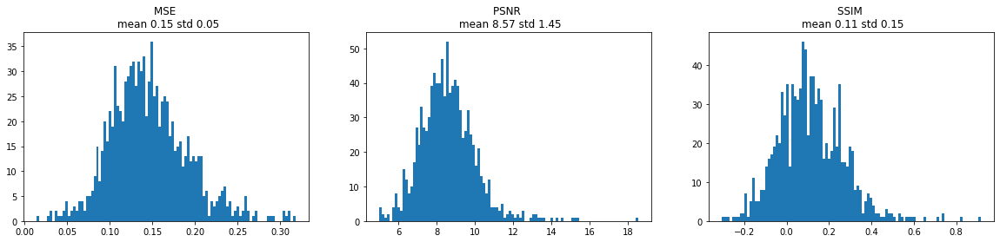

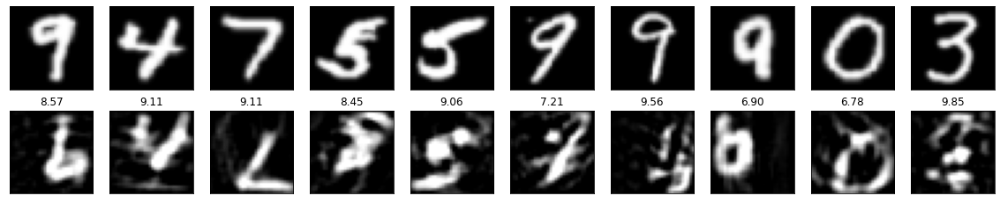

In [6]:
x_test_rec_mnist, mse_list_mnist, psnr_list_mnist, ssim_list_mnist = test_abs(n_test_mnist,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              'reference',
                                                                              x_test_mnist)

plot_test(x_test_rec_mnist,
          x_test_mnist,
          mse_list_mnist,
          psnr_list_mnist,
          ssim_list_mnist,
          n_test_mnist,
          plot_n = 10)

 25%|██▌       | 8/32 [00:00<00:00, 74.34it/s]

changed


100%|██████████| 32/32 [00:00<00:00, 81.18it/s]


mse 0.15
psnr 8.55
ssim 0.12
mean mse 0.15
psnr of mean 8.30
psnr of mean (mean of psnr) 8.30(8.55)


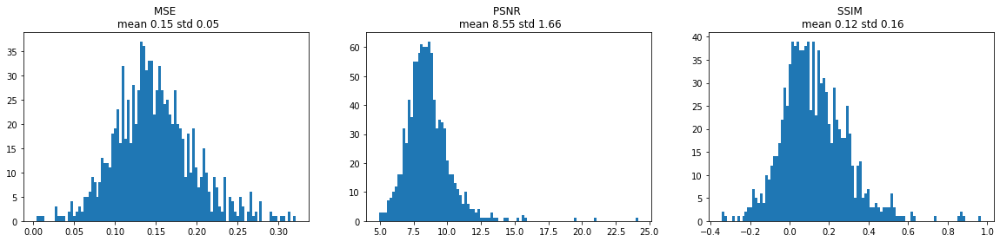

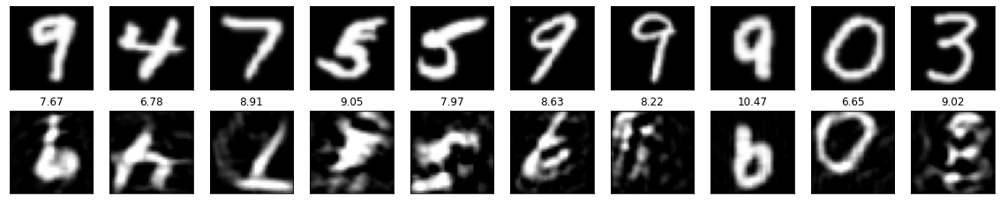

In [7]:
# Also this cannot be improved by rising the learning rate alpha (see Hyperparameter Search notebook)
x_test_rec_mnist, mse_list_mnist, psnr_list_mnist, ssim_list_mnist = test_abs(n_test_mnist,
                                                                              n_batch,
                                                                              n_steps,
                                                                              1.9,
                                                                              'reference',
                                                                              x_test_mnist)

plot_test(x_test_rec_mnist,
          x_test_mnist,
          mse_list_mnist,
          psnr_list_mnist,
          ssim_list_mnist,
          n_test_mnist,
          plot_n = 10)

## Cifar10

 25%|██▌       | 8/32 [00:00<00:00, 73.23it/s]

changed


100%|██████████| 32/32 [00:00<00:00, 77.48it/s]


mse 0.05
psnr 13.18
ssim 0.44
mean mse 0.05
psnr of mean 13.28
psnr of mean (mean of psnr) 13.28(13.18)


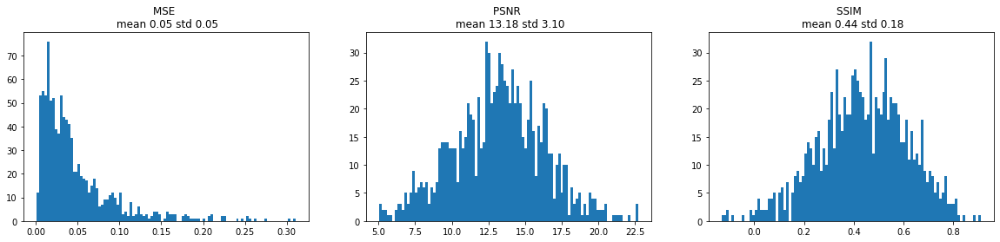

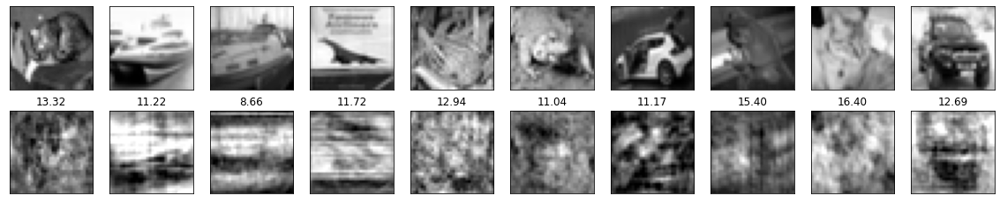

In [8]:
x_test_rec_cifar, mse_list_cifar, psnr_list_cifar, ssim_list_cifar = test_abs(n_test_cifar,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              'reference',
                                                                              x_test_cifar)

plot_test(x_test_rec_cifar,
          x_test_cifar,
          mse_list_cifar,
          psnr_list_cifar,
          ssim_list_cifar,
          n_test_cifar,
          plot_n = 10)

After this experiment, we revert all changes in test_abs.py

# 2.1 Oversampling in recovery

## No oversampling

In this part, we change the amount of oversampling in testing and later also in training and evaluate the performance. First, we use zero oversampling. To do so, we conduct the following changes to test_abs.py:
- Line 22: remove ```zeropad = nn.ZeroPad2d(height//2)```
- Line 43: change ```z = zeropad(x_gt + uk)``` $\Rightarrow$ ```z = x_gt + uk```
- Line 61: change ```z_est = zeropad(x_est + uk + eps_tensor)``` $\Rightarrow$ ```z_est = x_est + uk + eps_tensor```
- Line 74: change ```x_grad = x_grad_complex[:,:, height//2:height//2+height, width//2 :width//2 +width, 0]``` $\Rightarrow$ ```x_grad = x_grad_complex[:,:,:,:,0]```

## MNIST

 25%|██▌       | 8/32 [00:00<00:00, 79.33it/s]

changed


100%|██████████| 32/32 [00:00<00:00, 80.75it/s]


mse 0.14
psnr 8.92
ssim 0.19
mean mse 0.14
psnr of mean 8.58
psnr of mean (mean of psnr) 8.58(8.92)


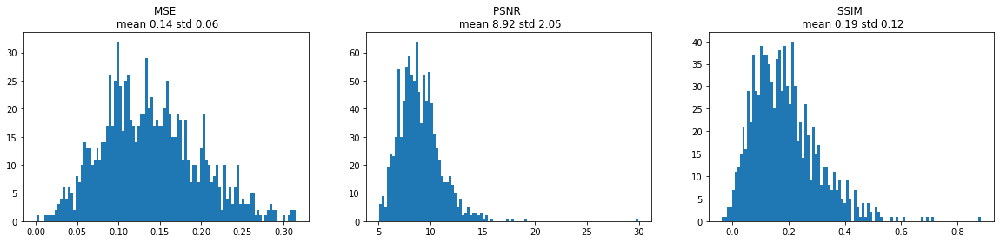

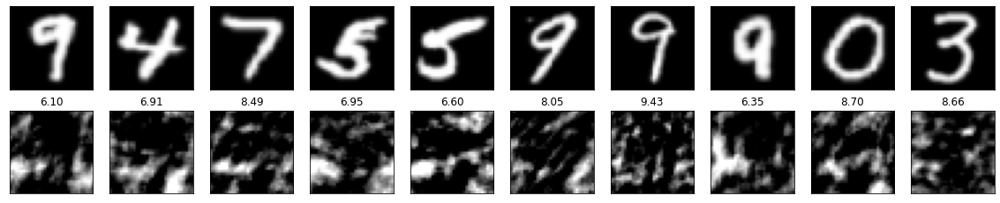

In [9]:
x_test_rec_mnist, mse_list_mnist, psnr_list_mnist, ssim_list_mnist = test_abs(n_test_mnist,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u_mnist,
                                                                              x_test_mnist)

plot_test(x_test_rec_mnist,
          x_test_mnist,
          mse_list_mnist,
          psnr_list_mnist,
          ssim_list_mnist,
          n_test_mnist,
          plot_n = 10)

## CIFAR10

 25%|██▌       | 8/32 [00:00<00:00, 79.87it/s]

changed


100%|██████████| 32/32 [00:00<00:00, 83.02it/s]


mse 0.03
psnr 13.58
ssim 0.52
mean mse 0.03
psnr of mean 15.21
psnr of mean (mean of psnr) 15.21(13.58)


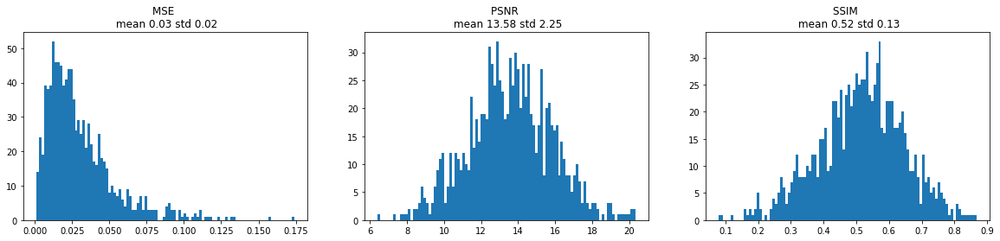

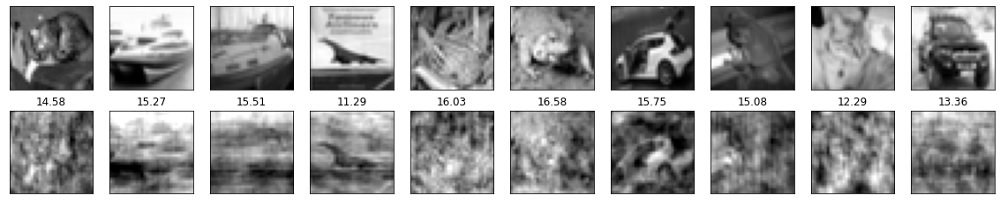

In [10]:
x_test_rec_cifar, mse_list_cifar, psnr_list_cifar, ssim_list_cifar = test_abs(n_test_cifar,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u_cifar,
                                                                              x_test_cifar)

plot_test(x_test_rec_cifar,
          x_test_cifar,
          mse_list_cifar,
          psnr_list_cifar,
          ssim_list_cifar,
          n_test_cifar,
          plot_n = 10)

## The cameraman

100%|██████████| 1/1 [00:00<00:00, 48.92it/s]

changed
mse 0.06
psnr 12.02
ssim 0.57
mean mse 0.06
psnr of mean 11.94
psnr of mean (mean of psnr) 11.94(12.02)


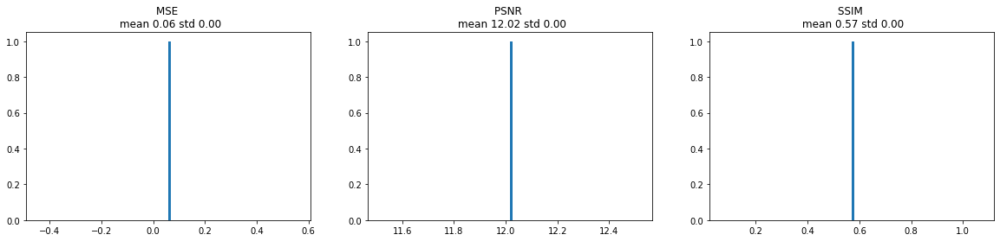

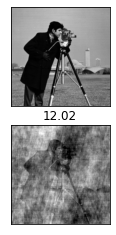

In [12]:
x_rec_std, mse_list_std, psnr_list_std, ssim_list_std= test_abs(1, 1, n_steps, alpha, u_celeb, std_images)

plot_test(x_rec_std,
          std_images,
          mse_list_std,
          psnr_list_std,
          ssim_list_std,
          1,
          plot_n = 1)

## 2 times oversampling

To perform experiments with only 2 times oversampling we conduct the following changes to test_abs.py:
- Line 22: change ```zeropad = nn.ZeroPad2d(height//2)```  $\Rightarrow$ ```zeropad = nn.ZeroPad2d(height//4)```
- Line 74: change ```x_grad = x_grad_complex[:,:, height//2:height//2+height, width//2 :width//2 +width, 0]``` $\Rightarrow$ ```x_grad = x_grad_complex[:,:, height//4:height//4+height, width//4 :width//4 +width, 0]```

## MNIST

 22%|██▏       | 7/32 [00:00<00:00, 65.24it/s]

changed


100%|██████████| 32/32 [00:00<00:00, 75.41it/s]


mse 0.01
psnr 38.75
ssim 0.91
mean mse 0.01
psnr of mean 22.14
psnr of mean (mean of psnr) 22.14(38.75)


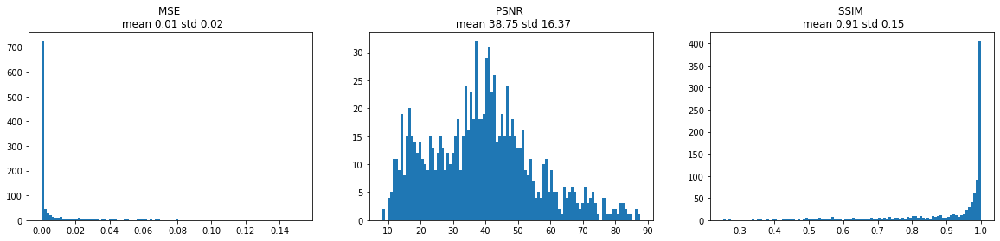

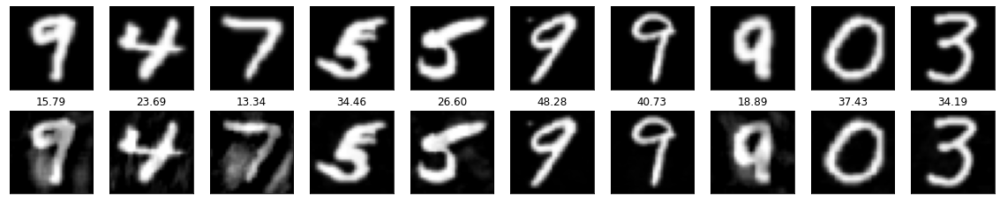

In [13]:
x_test_rec_mnist, mse_list_mnist, psnr_list_mnist, ssim_list_mnist = test_abs(n_test_mnist,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u_mnist,
                                                                              x_test_mnist)

plot_test(x_test_rec_mnist,
          x_test_mnist,
          mse_list_mnist,
          psnr_list_mnist,
          ssim_list_mnist,
          n_test_mnist,
          plot_n = 10)

## CIFAR10

 22%|██▏       | 7/32 [00:00<00:00, 69.76it/s]

changed


100%|██████████| 32/32 [00:00<00:00, 77.39it/s]


mse 0.01
psnr 21.12
ssim 0.86
mean mse 0.01
psnr of mean 21.43
psnr of mean (mean of psnr) 21.43(21.12)


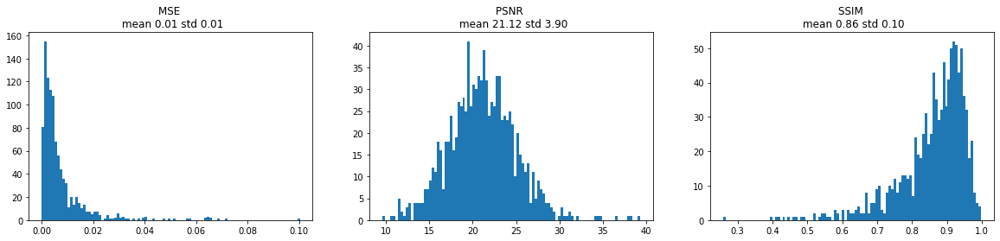

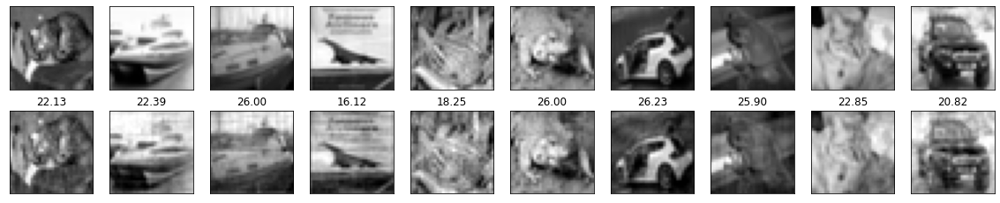

In [14]:
x_test_rec_cifar, mse_list_cifar, psnr_list_cifar, ssim_list_cifar = test_abs(n_test_cifar,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u_cifar,
                                                                              x_test_cifar)

plot_test(x_test_rec_cifar,
          x_test_cifar,
          mse_list_cifar,
          psnr_list_cifar,
          ssim_list_cifar,
          n_test_cifar,
          plot_n = 10)

## The cameraman

100%|██████████| 1/1 [00:00<00:00, 34.40it/s]

changed
mse 0.03
psnr 15.18
ssim 0.70
mean mse 0.03
psnr of mean 15.11
psnr of mean (mean of psnr) 15.11(15.18)


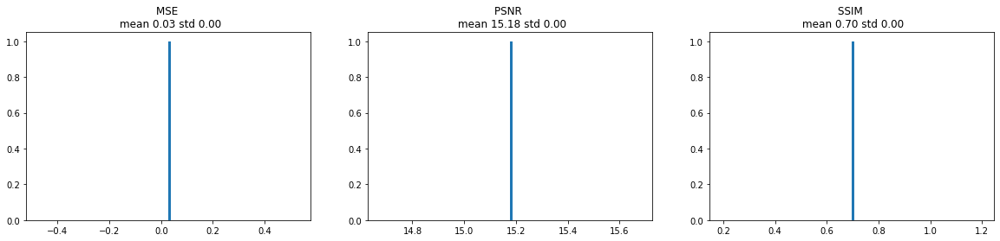

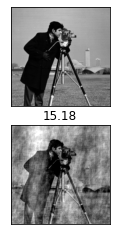

In [16]:
x_rec_std, mse_list_std, psnr_list_std, ssim_list_std= test_abs(1, 1, n_steps, alpha, u_celeb, std_images)

plot_test(x_rec_std,
          std_images,
          mse_list_std,
          psnr_list_std,
          ssim_list_std,
          1,
          plot_n = 1)

## 4 times oversampling (the authors choice)

For this experient we do not change the authors code as it already uses four times oversampling.

## MNIST

100%|██████████| 32/32 [00:00<00:00, 55.22it/s]


mse 0.00
psnr 54.28
ssim 0.96
mean mse 0.00
psnr of mean 24.91
psnr of mean (mean of psnr) 24.91(54.28)


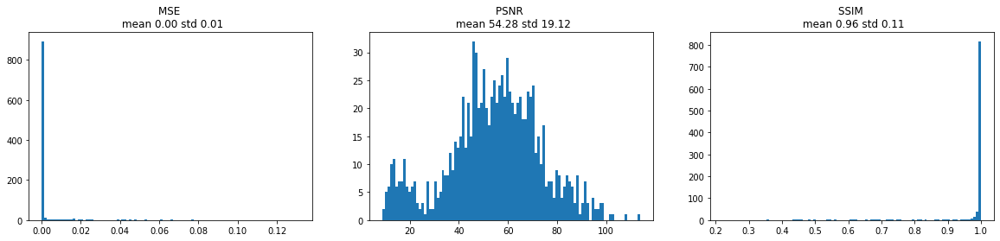

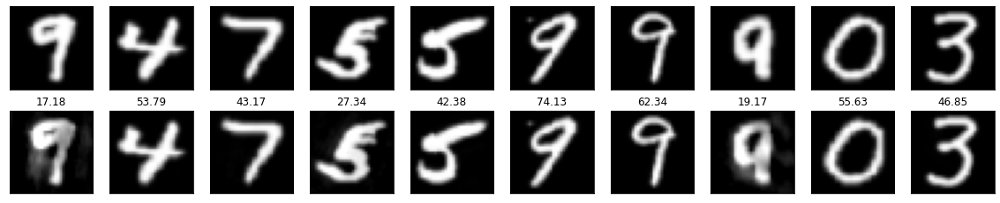

In [17]:
x_test_rec_mnist, mse_list_mnist, psnr_list_mnist, ssim_list_mnist = test_abs(n_test_mnist,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u_mnist,
                                                                              x_test_mnist)

plot_test(x_test_rec_mnist,
          x_test_mnist,
          mse_list_mnist,
          psnr_list_mnist,
          ssim_list_mnist,
          n_test_mnist,
          plot_n = 10)

## CIFAR10

100%|██████████| 32/32 [00:00<00:00, 59.05it/s]


mse 0.00
psnr 39.03
ssim 0.97
mean mse 0.00
psnr of mean 27.86
psnr of mean (mean of psnr) 27.86(39.03)


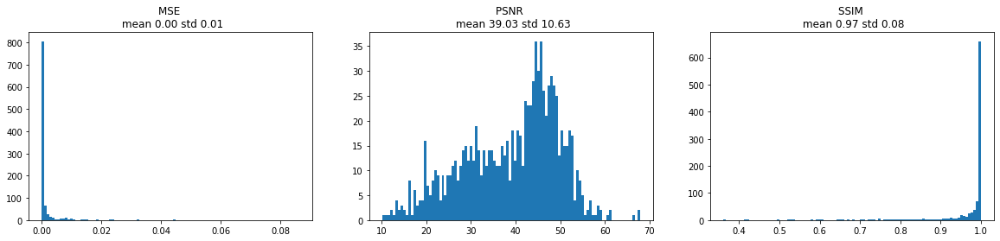

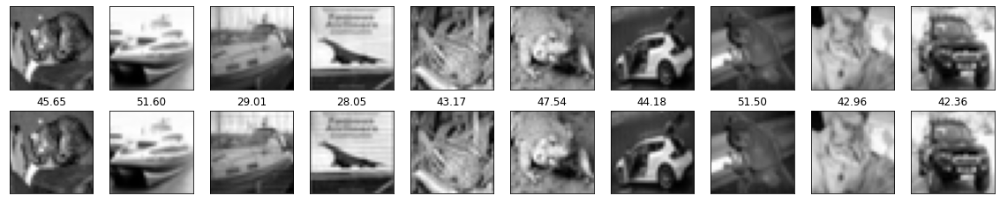

In [18]:
x_test_rec_cifar, mse_list_cifar, psnr_list_cifar, ssim_list_cifar = test_abs(n_test_cifar,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u_cifar,
                                                                              x_test_cifar)

plot_test(x_test_rec_cifar,
          x_test_cifar,
          mse_list_cifar,
          psnr_list_cifar,
          ssim_list_cifar,
          n_test_cifar,
          plot_n = 10)

## The cameraman

100%|██████████| 1/1 [00:00<00:00, 23.81it/s]


mse 0.00
psnr 30.06
ssim 0.94
mean mse 0.00
psnr of mean 31.17
psnr of mean (mean of psnr) 31.17(30.06)


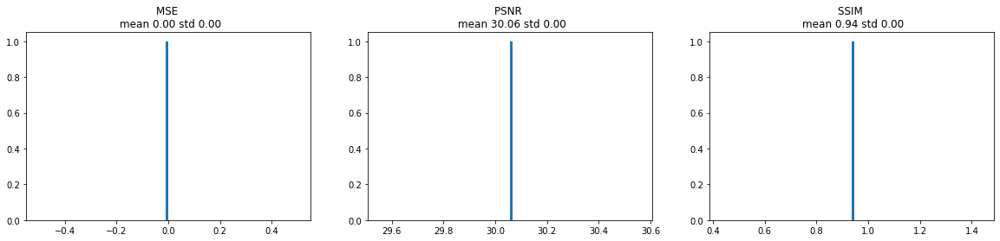

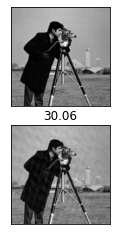

In [19]:
x_rec_std, mse_list_std, psnr_list_std, ssim_list_std= test_abs(1, 1, n_steps, alpha, u_celeb, std_images)

plot_test(x_rec_std,
          std_images,
          mse_list_std,
          psnr_list_std,
          ssim_list_std,
          1,
          plot_n = 1)

## 8 times oversampling

To perform our experiments with 8 times oversampling we conduct the following changes to test_abs.py:
- Line 22: change ```zeropad = nn.ZeroPad2d(height//2)```  $\Rightarrow$ ```zeropad = nn.ZeroPad2d(height)```
- Line 74: change ```x_grad = x_grad_complex[:,:, height//2:height//2+height, width//2 :width//2 +width, 0]``` $\Rightarrow$ ```x_grad = x_grad_complex[:,:, height:height+height, width:width+width, 0]```

## MNIST

 25%|██▌       | 8/32 [00:00<00:00, 71.16it/s]

changed


100%|██████████| 32/32 [00:00<00:00, 77.79it/s]


mse 0.00
psnr 58.19
ssim 0.97
mean mse 0.00
psnr of mean 25.92
psnr of mean (mean of psnr) 25.92(58.19)


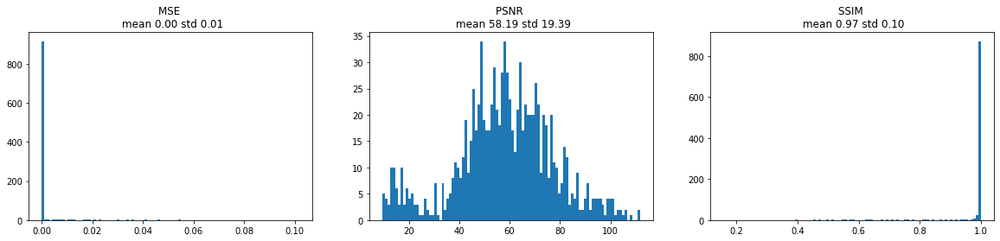

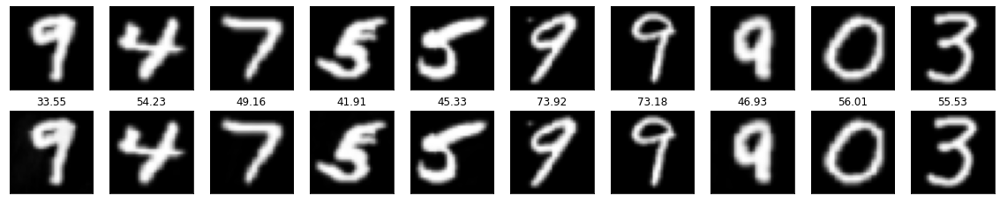

In [21]:
x_test_rec_mnist, mse_list_mnist, psnr_list_mnist, ssim_list_mnist = test_abs(n_test_mnist,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u_mnist,
                                                                              x_test_mnist)

plot_test(x_test_rec_mnist,
          x_test_mnist,
          mse_list_mnist,
          psnr_list_mnist,
          ssim_list_mnist,
          n_test_mnist,
          plot_n = 10)

## CIFAR10

 22%|██▏       | 7/32 [00:00<00:00, 67.45it/s]

changed


100%|██████████| 32/32 [00:00<00:00, 70.90it/s]


mse 0.00
psnr 40.80
ssim 0.98
mean mse 0.00
psnr of mean 28.87
psnr of mean (mean of psnr) 28.87(40.80)


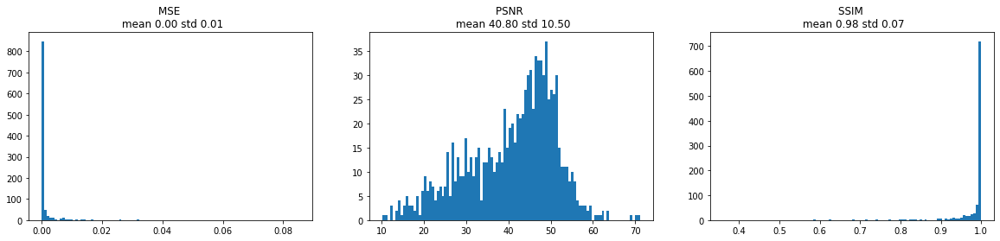

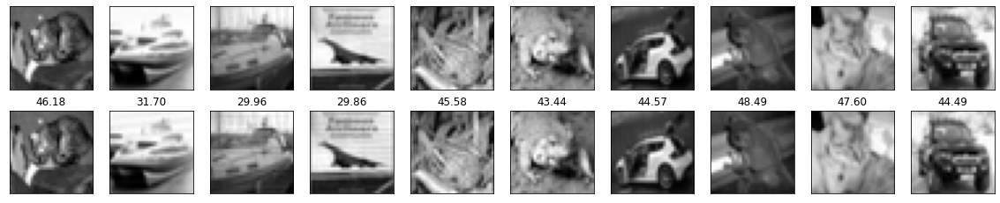

In [22]:
x_test_rec_cifar, mse_list_cifar, psnr_list_cifar, ssim_list_cifar = test_abs(n_test_cifar,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u_cifar,
                                                                              x_test_cifar)

plot_test(x_test_rec_cifar,
          x_test_cifar,
          mse_list_cifar,
          psnr_list_cifar,
          ssim_list_cifar,
          n_test_cifar,
          plot_n = 10)

## The cameraman

100%|██████████| 1/1 [00:00<00:00,  9.75it/s]

changed
mse 0.00
psnr 30.71
ssim 0.94
mean mse 0.00
psnr of mean 32.14
psnr of mean (mean of psnr) 32.14(30.71)


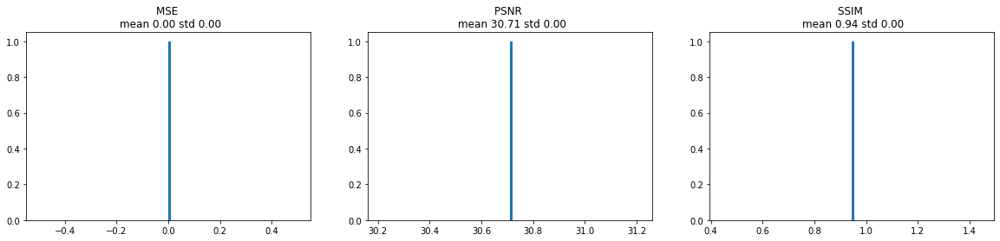

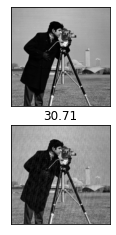

In [23]:
x_rec_std, mse_list_std, psnr_list_std, ssim_list_std= test_abs(1, 1, n_steps, alpha, u_celeb, std_images)

plot_test(x_rec_std,
          std_images,
          mse_list_std,
          psnr_list_std,
          ssim_list_std,
          1,
          plot_n = 1)

# 2.2 No oversampling in training

To perform these experiments we use the provided test_abs.py while we conduct the following changes to train_abs.py:
- Line 20: remove ```zeropad = nn.ZeroPad2d(height//2)```
- Line 67: change ```z = zeropad(x_gt + uk)``` $\Rightarrow$ ```z = x_gt + uk```
- Line 83: change ```z_est = zeropad(x_est + uk + eps_tensor)``` $\Rightarrow$ ```z_est = x_est + uk + eps_tensor```
- Line 92: change ```x_grad = x_grad_complex[:,:, height//2:height//2+height, width//2:width//2+width, 0]``` $\Rightarrow$ ```x_grad = x_grad_complex[:,:,:,:, 0]```

## MNIST

changed
0
best so far 1


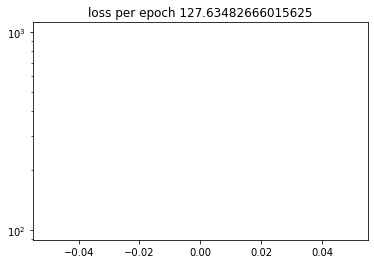

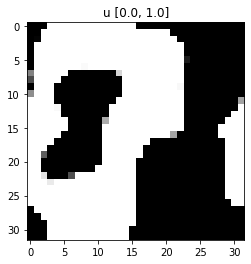

psnr 9.043307304382324
mse 0.12464338541030884


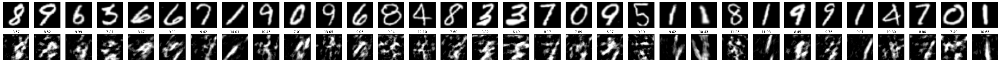

1
best so far 2


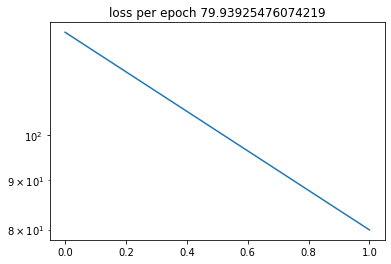

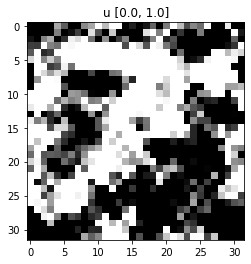

psnr 11.075398921966553
mse 0.07806567847728729


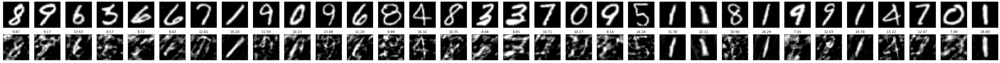

2
best so far 3


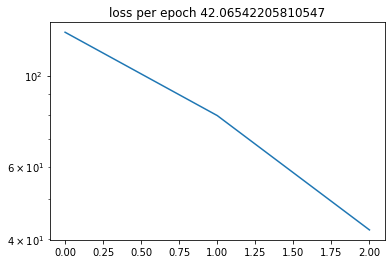

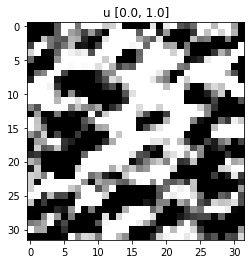

psnr 13.863747119903564
mse 0.04107951372861862


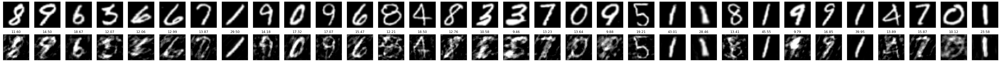

3
best so far 4


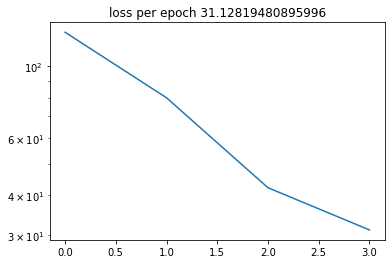

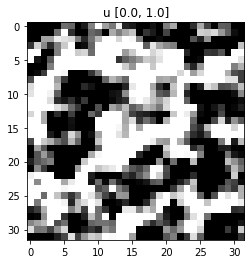

psnr 15.171459913253784
mse 0.03039862960577011


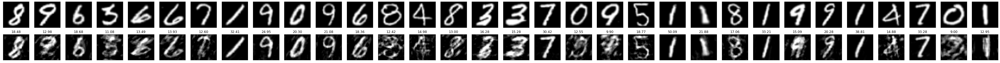

4
best so far 5


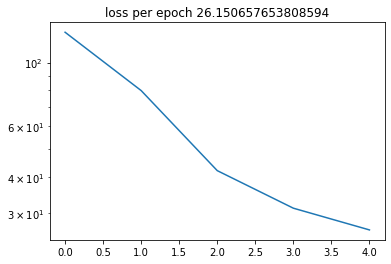

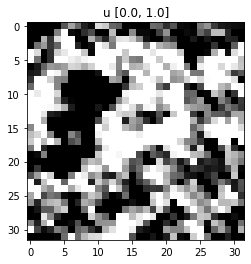

psnr 15.928174257278442
mse 0.025537749752402306


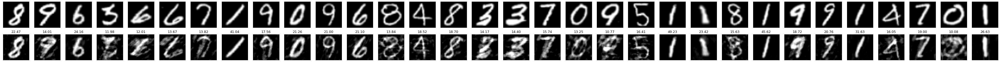

best_epoch 5


In [24]:
train_abs(n_epoch,n_train,n_batch,alpha,lr_u,n_steps,U_range,'mnist',x_train_mnist)
path = f'./output_abs/20200202_mnist_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_mnist_32.npy'
u = np.load(path)

100%|██████████| 32/32 [00:00<00:00, 77.16it/s]


mse 0.00
psnr 47.90
ssim 0.97
mean mse 0.00
psnr of mean 26.50
psnr of mean (mean of psnr) 26.50(47.90)


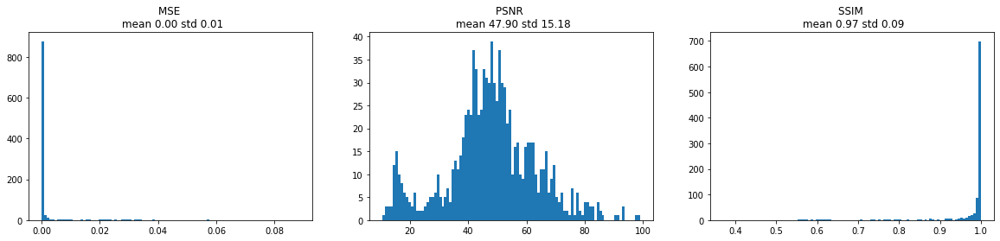

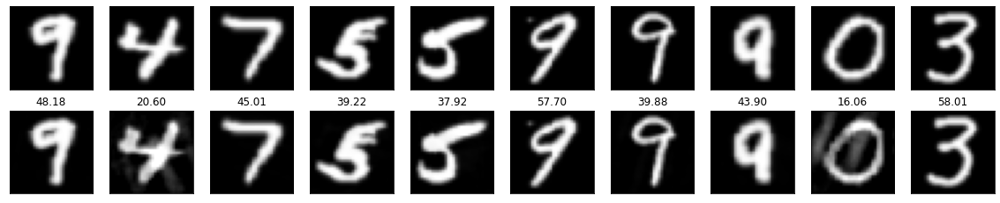

In [25]:
x_test_rec_mnist, mse_list_mnist, psnr_list_mnist, ssim_list_mnist = test_abs(n_test_mnist,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u,
                                                                              x_test_mnist)

plot_test(x_test_rec_mnist,
          x_test_mnist,
          mse_list_mnist,
          psnr_list_mnist,
          ssim_list_mnist,
          n_test_mnist,
          plot_n = 10)

## CIFAR10

changed
0
best so far 1


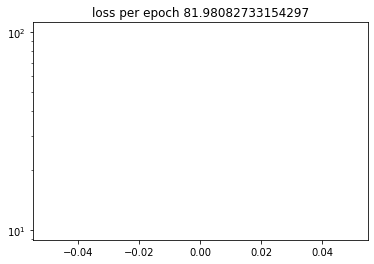

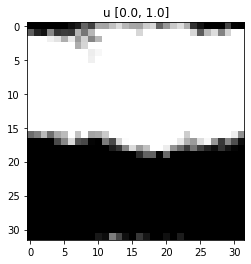

psnr 10.965007543563843
mse 0.08005940914154053


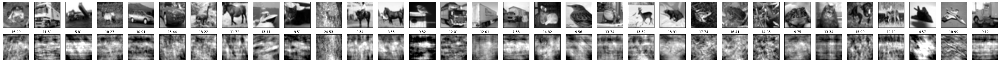

1
best so far 2


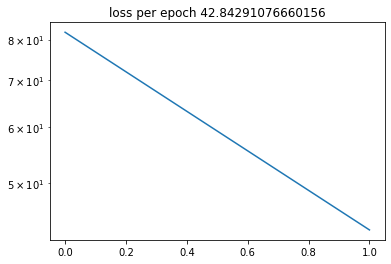

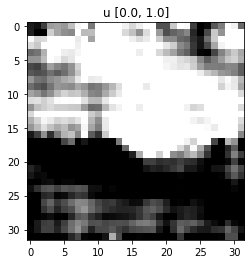

psnr 13.783340454101562
mse 0.04183878004550934


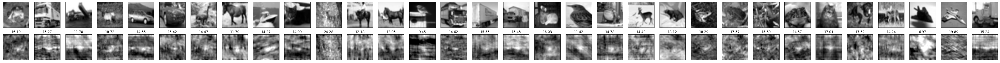

2
best so far 3


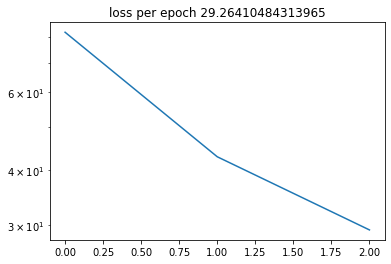

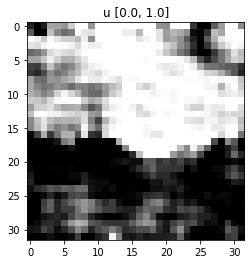

psnr 15.438778400421143
mse 0.028578227385878563


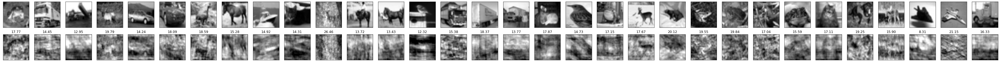

3
best so far 4


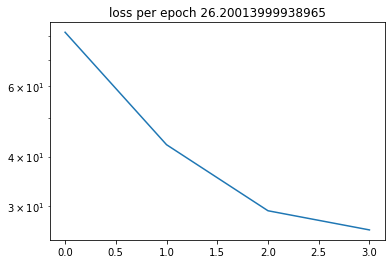

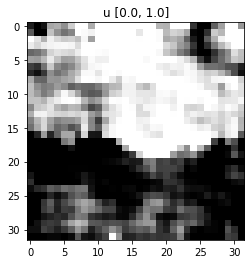

psnr 15.91909408569336
mse 0.025586076080799103


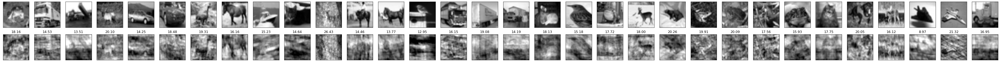

4
best so far 5


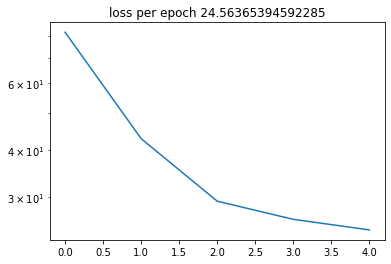

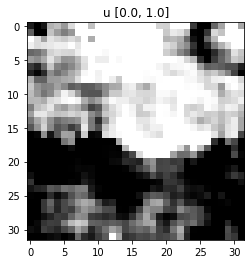

psnr 16.199201345443726
mse 0.023987941443920135


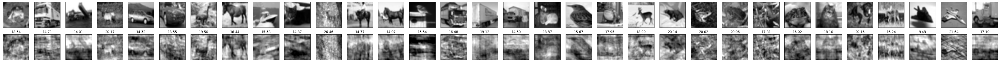

best_epoch 5


In [26]:
train_abs(n_epoch,n_train,n_batch,alpha,lr_u,n_steps,U_range,'cifar',x_train_cifar)
path = f'./output_abs/20200202_cifar_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_cifar_32.npy'
u = np.load(path)

100%|██████████| 32/32 [00:00<00:00, 77.44it/s]


mse 0.00
psnr 34.88
ssim 0.97
mean mse 0.00
psnr of mean 28.19
psnr of mean (mean of psnr) 28.19(34.88)


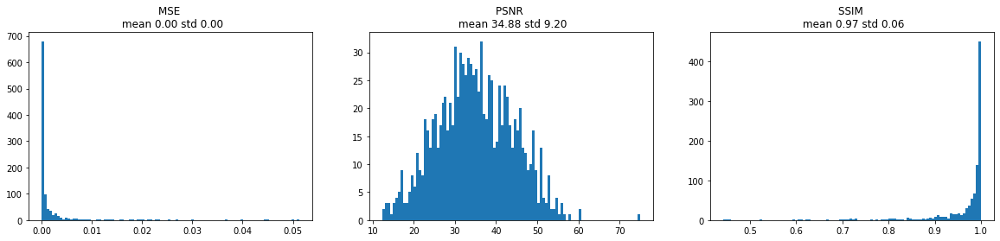

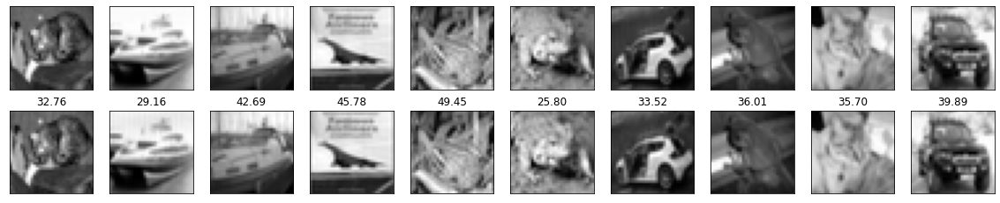

In [27]:
x_test_rec_cifar, mse_list_cifar, psnr_list_cifar, ssim_list_cifar = test_abs(n_test_cifar,
                                                                              n_batch,
                                                                              n_steps,
                                                                              alpha,
                                                                              u,
                                                                              x_test_cifar)

plot_test(x_test_rec_cifar,
          x_test_cifar,
          mse_list_cifar,
          psnr_list_cifar,
          ssim_list_cifar,
          n_test_cifar,
          plot_n = 10)

## The cameraman

changed
0
best so far 1


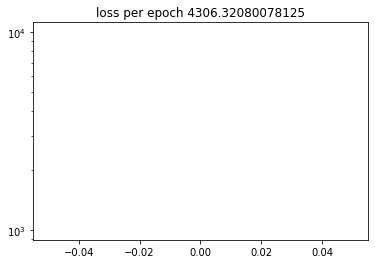

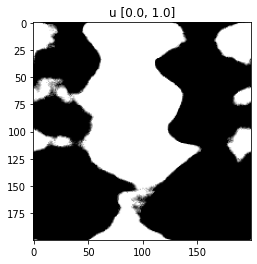

psnr 9.678667783737183
mse 0.10765799880027771


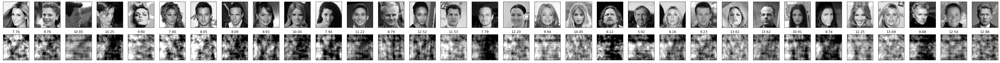

1
best so far 2


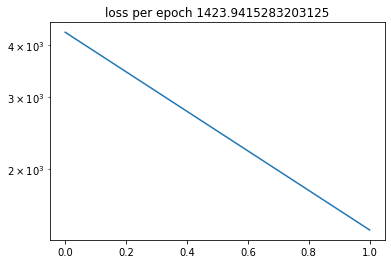

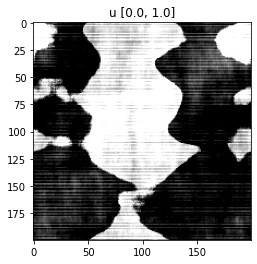

psnr 14.484808444976807
mse 0.035598549991846085


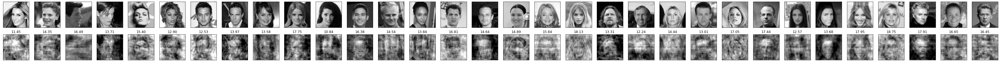

2
best so far 3


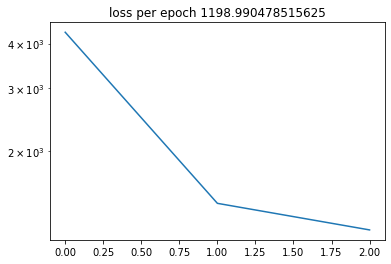

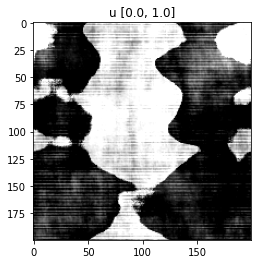

psnr 15.231573581695557
mse 0.029974758625030518


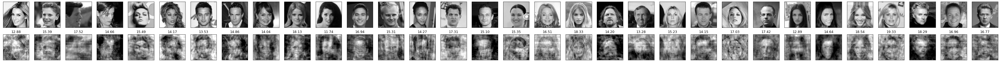

3
best so far 4


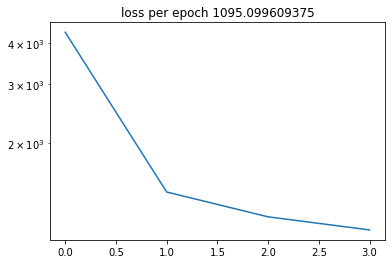

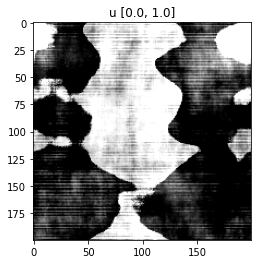

psnr 15.625195503234863
mse 0.02737748995423317


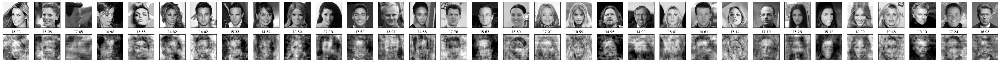

4
best so far 5


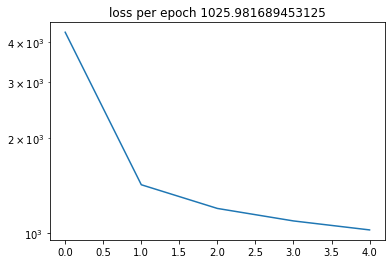

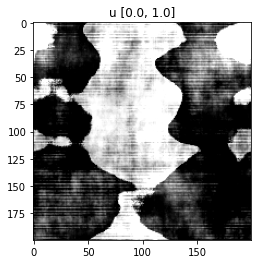

psnr 15.908335447311401
mse 0.02564954198896885


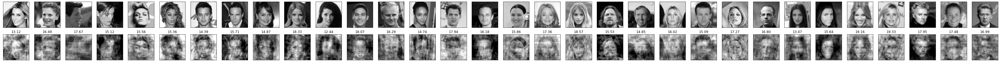

best_epoch 5


In [33]:
train_abs(n_epoch,n_train,n_batch,alpha,lr_u,n_steps,U_range,'celeb',x_train_celeb)
path = f'./output_abs/20200202_celeb_{n_epoch}_{n_train//n_batch}_{n_batch}_{alpha}_{lr_u}_{n_steps}_{U_range}/u_celeb_32.npy'
u = np.load(path)

In [34]:
u = resize(u, (1, 512,512))
print(u.shape)

(1, 512, 512)


100%|██████████| 1/1 [00:00<00:00, 24.89it/s]


mse 0.00
psnr 25.02
ssim 0.83
mean mse 0.00
psnr of mean 25.26
psnr of mean (mean of psnr) 25.26(25.02)


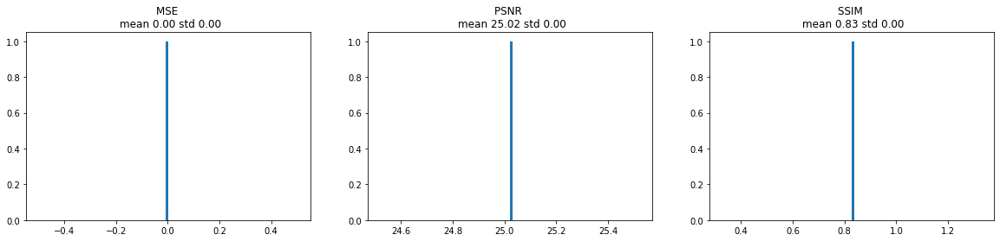

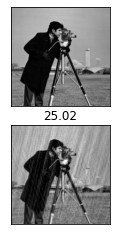

In [35]:
x_rec_std, mse_list_std, psnr_list_std, ssim_list_std= test_abs(1, 1, n_steps, alpha, u, std_images)

plot_test(x_rec_std,
          std_images,
          mse_list_std,
          psnr_list_std,
          ssim_list_std,
          1,
          plot_n = 1)